# Import data set

In [1]:
import pandas as pd
import os
import re
from datetime import datetime
from tqdm import tqdm
from top2vec import Top2Vec

In [2]:
!pwd

/home/paularilo/code/paularilo/topic-modelling-reviews


In [3]:
df = pd.read_csv('raw_data/clean_b1_fortext.csv')
df = df[df['text'].notna()]
len(df)

<ipython-input-3-61d172ab1314>:1: DtypeWarning: Columns (12) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('raw_data/clean_b1_fortext.csv')


166814

In [4]:
dtext = df[['title','text']]

# Clean linguistic data with nltk

In [5]:
# Remove German part
dtext['result'] = dtext['text'].str.replace('(Translated by Google)', '')
dtext['english'] = dtext["result"].str.split(r"(Original)", expand=True)[0] # remove translation
# Remove white spaces and symbols
text = dtext['english']
text_clean = [re.sub(r'http\S+', '', t) for t in text]
text_clean= [t.strip().replace('\n', ' ') for t in text_clean]
docs = [re.sub(r'[\w\.-]+@[\w\.-]+', '', t) for t in text_clean]
docs = [t.strip().replace('`', ' ') for t in docs]
docs = [t.strip().replace('--', ' ') for t in docs]

<ipython-input-5-2c24726efc43>:2: FutureWarning: The default value of regex will change from True to False in a future version.
  dtext['result'] = dtext['text'].str.replace('(Translated by Google)', '')
<ipython-input-5-2c24726efc43>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dtext['result'] = dtext['text'].str.replace('(Translated by Google)', '')
<ipython-input-5-2c24726efc43>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dtext['english'] = dtext["result"].str.split(r"(Original)", expand=True)[0

Thought for future: COMBINE ALL REVIEWS FROM SAME PLACE (1 document PER SHOP)

In [6]:
docs[0]

'() Fabulous service. The gentleman was serving another customer and while he was examining a piece of clothing, I was handed another piece of clothing by the same clerk and another clerk called to help. I have never experienced such good & attentive service in a clothing store! The other customer experienced no disadvantage as a result.  Especially the upper floor is very dangerous for the wallet. Very very nice things!  ('

# Use the corpus to train the bigram model
I used bigrams because I am interested in adjective + noun phrases (e.g., friendly staff)

In [7]:
from gensim.models import Phrases
from gensim.models.phrases import Phraser

In [8]:
sentence_stream = [doc.split(" ") for doc in docs]
bigram = Phrases(sentence_stream, min_count=5, threshold=100, delimiter=' ')
bigram_phraser = Phraser(bigram)

In [9]:
from gensim.utils import simple_preprocess
from gensim.parsing.preprocessing import strip_tags

def bigrammer(doc):
    #sentence_stream = doc.split(" ")
    sentence_stream = simple_preprocess(strip_tags(doc), deacc=True)
    return bigram_phraser[sentence_stream]

# Training the top2vec model

In [24]:
#model = Top2Vec(documents=docs, speed="deep-learn", tokenizer=bigrammer, workers=8) # pass in bigrammer in place of default_tokenizer, warning, deep-learn takes a long time
#model.save("top2vec_user_reviews_deeplearn")
model = Top2Vec.load("top2vec_user_reviews_deeplearn")

In [25]:
n = model.get_num_topics()
n

2275

## Get information about the topics

In [14]:
topic_words, word_scores, topic_nums = model.get_topics(n)

In [27]:
topic_words

array([ 823,  869, 1072, 1249,  952,   89,  306,  422,  685, 1997])

In [16]:
topic_sizes, topic_nums = model.get_topic_sizes()

Searching for specific word (e.g., expensive)

In [29]:
import matplotlib.pyplot as plt
%matplotlib inline

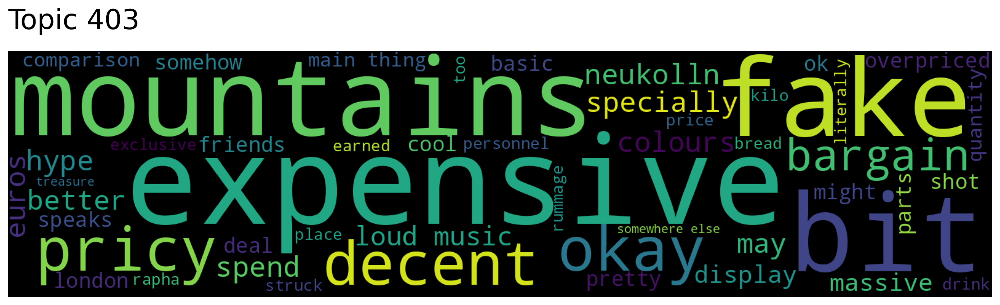

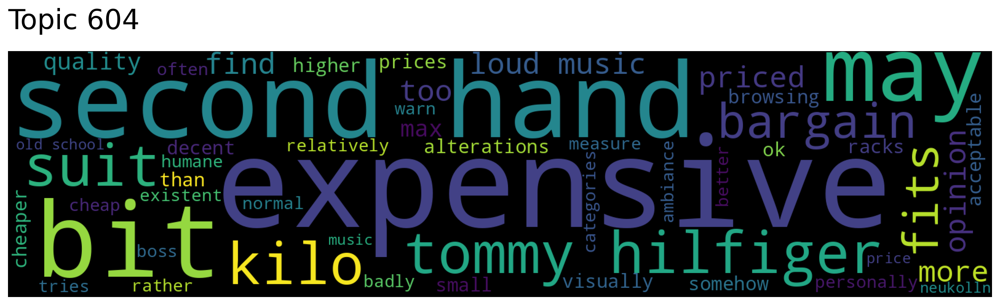

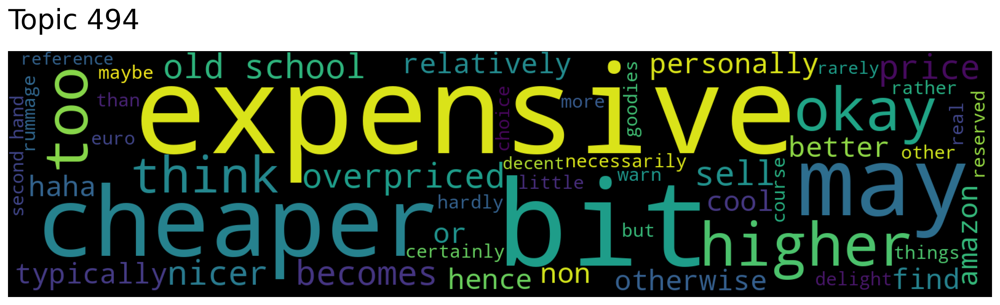

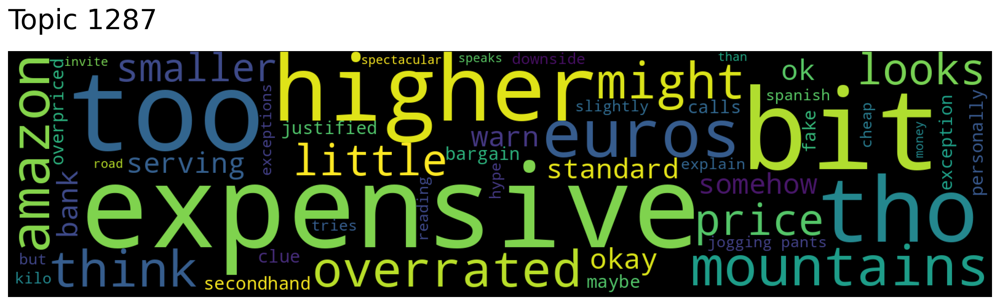

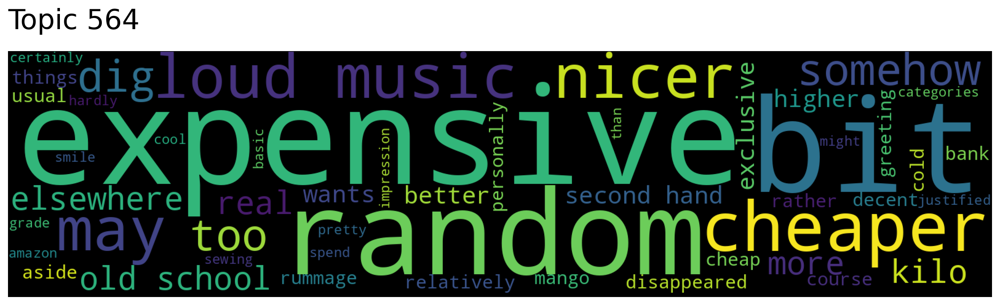

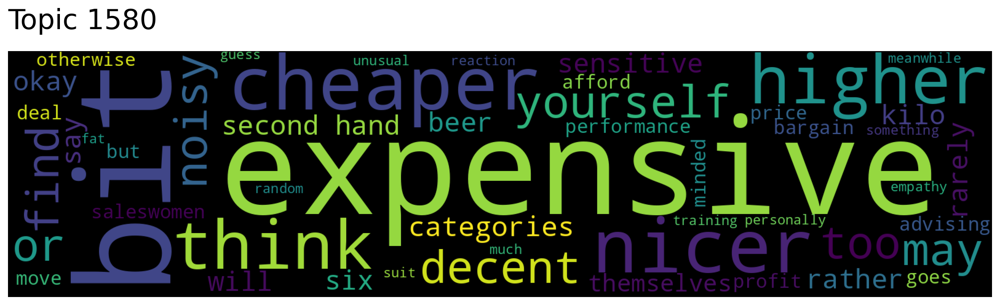

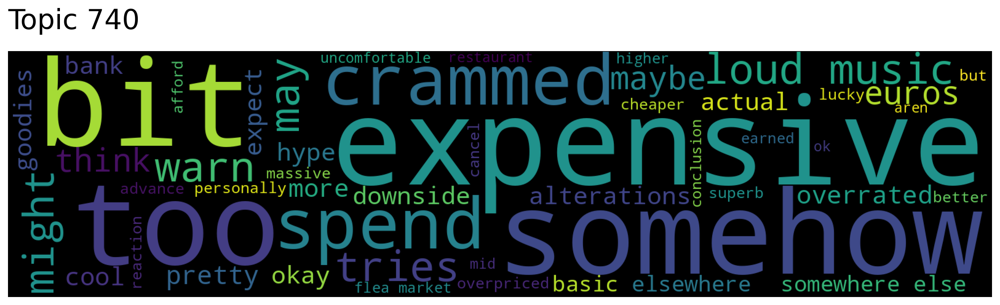

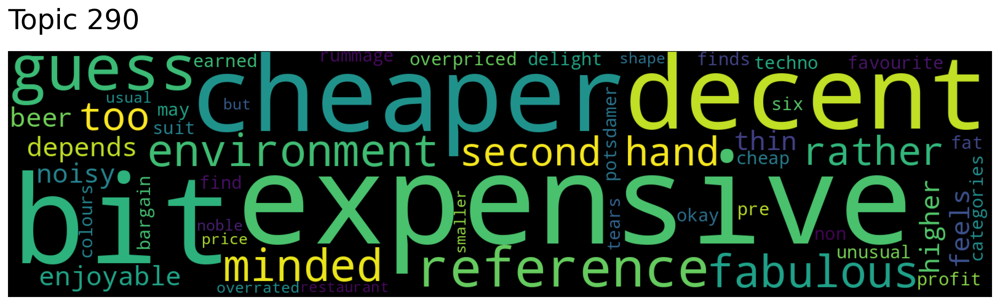

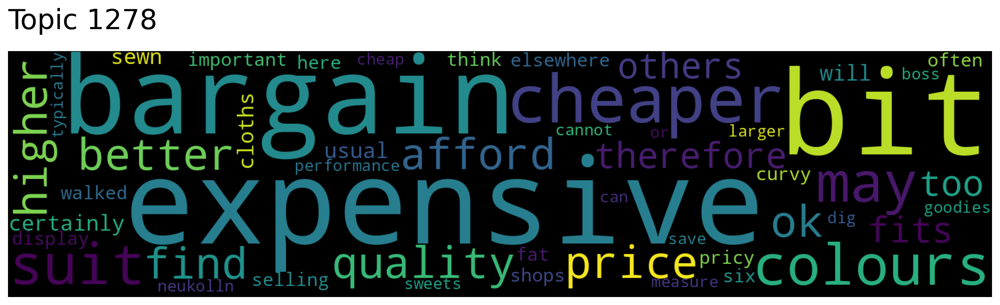

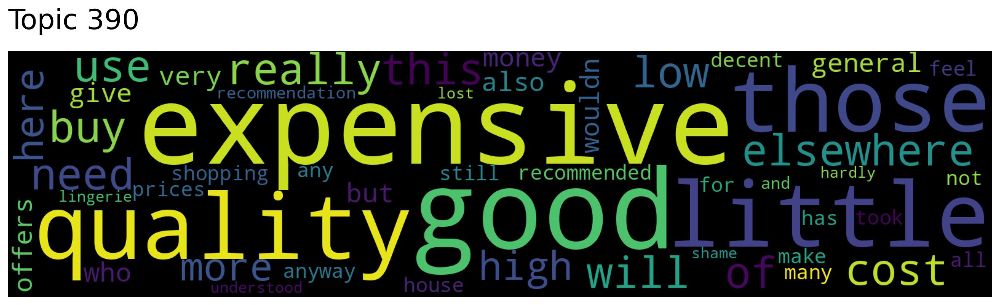

In [31]:
topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["expensive"], num_topics=10)
for topic in topic_nums:
    model.generate_topic_wordcloud(topic)

**Example of documents with relevant topics: 604, 1287**

In [34]:
documents, document_scores, document_ids = model.search_documents_by_topic(topic_num=1287, num_docs=10)
for doc, score, doc_id in zip(documents, document_scores, document_ids):
    print(f"Document: {doc_id}, Score: {score}")
    print("-----------")
    print(doc)
    print("-----------")
    print()

Document: 130245, Score: 0.9241821765899658
-----------
Very expensive.
-----------

Document: 130250, Score: 0.9219135642051697
-----------
() Expensive  (
-----------

Document: 130508, Score: 0.9176336526870728
-----------
Very expensive.
-----------

Document: 127192, Score: 0.9055293202400208
-----------
() Expensive  (
-----------

Document: 130220, Score: 0.9039701819419861
-----------
() Very expensive....  (
-----------

Document: 130455, Score: 0.9013368487358093
-----------
() Expensive  (
-----------

Document: 129284, Score: 0.8998563885688782
-----------
() Too expensive  (
-----------

Document: 126913, Score: 0.86690354347229
-----------
() Very expensive  (
-----------

Document: 121524, Score: 0.8642505407333374
-----------
() Expensive  (
-----------

Document: 123218, Score: 0.858160674571991
-----------
() too expensive ...  (
-----------



In [42]:
documents, document_scores, document_ids = model.search_documents_by_keywords(keywords=["rude"], num_docs=10)
for doc, score, doc_id in zip(documents, document_scores, document_ids):
    print(f"Document: {doc_id}, Score: {score}")
    print("-----------")
    print(doc)
    print("-----------")
    print()

Document: 157038, Score: 0.3130565285682678
-----------
() Staff is rude.  (
-----------

Document: 91473, Score: 0.30899909138679504
-----------
() Very rude staff !!!!!!  (
-----------

Document: 68442, Score: 0.2965496778488159
-----------
() Staff were very rude!  (
-----------

Document: 68293, Score: 0.2933363914489746
-----------
() Staff were very rude!  (
-----------

Document: 41466, Score: 0.29279208183288574
-----------
The beast stor
-----------

Document: 41574, Score: 0.29073652625083923
-----------
The beast stor
-----------

Document: 158164, Score: 0.2889454960823059
-----------
() The tenants are very nice  (
-----------

Document: 82898, Score: 0.28445547819137573
-----------
() Rude staff.  (
-----------

Document: 96083, Score: 0.2843729555606842
-----------
() Good  (
-----------

Document: 86012, Score: 0.28064268827438354
-----------
Rude staff
-----------



Inspect one of the documents

In [48]:
doc_topics = model.get_documents_topics([100])
doc_topics

(array([479]),
 array([0.78430337], dtype=float32),
 array([['friendlier', 'pricy', 'pricey', 'mountains', 'handpicked',
         'autumn', 'wool', 'dig', 'hall', 'mirrors', 'amount',
         'comparison', 'biggest', 'overly', 'donated', 'okay',
         'polyester', 'quantity', 'laden', 'familiar', 'row', 'motivated',
         'goose', 'fake', 'cashmere', 'moving', 'district', 'donations',
         'sporty', 'shoppers', 'ecological', 'possibly', 'zeeman',
         'hackescher', 'underground', 'ok', 'alright', 'decoration',
         'delight', 'intimissimi', 'humana', 'patterns', 'organized',
         'inviting', 'setting', 'limited', 'bit', 'nicely decorated',
         'supplies', 'mostly']], dtype='<U23'),
 array([[0.17211093, 0.14395222, 0.1437878 , 0.13639134, 0.13357209,
         0.12775168, 0.12535825, 0.12202126, 0.11836207, 0.11581597,
         0.11435152, 0.11061968, 0.10759341, 0.10713544, 0.10644814,
         0.10506455, 0.10490443, 0.0991675 , 0.09884803, 0.09839866,
     

In [49]:
topic_names = doc_topics[2]
topic_probs = doc_topics[3]
df_topics = pd.DataFrame(topic_names).transpose().rename(columns={0 : "Topics"})
df_probs = pd.DataFrame(topic_probs).transpose().rename(columns={0 : "Probability"})
df = pd.concat([df_topics, df_probs], axis=1)

In [46]:
import seaborn as sns
sns.set(rc={'figure.figsize':(11.7,12)})

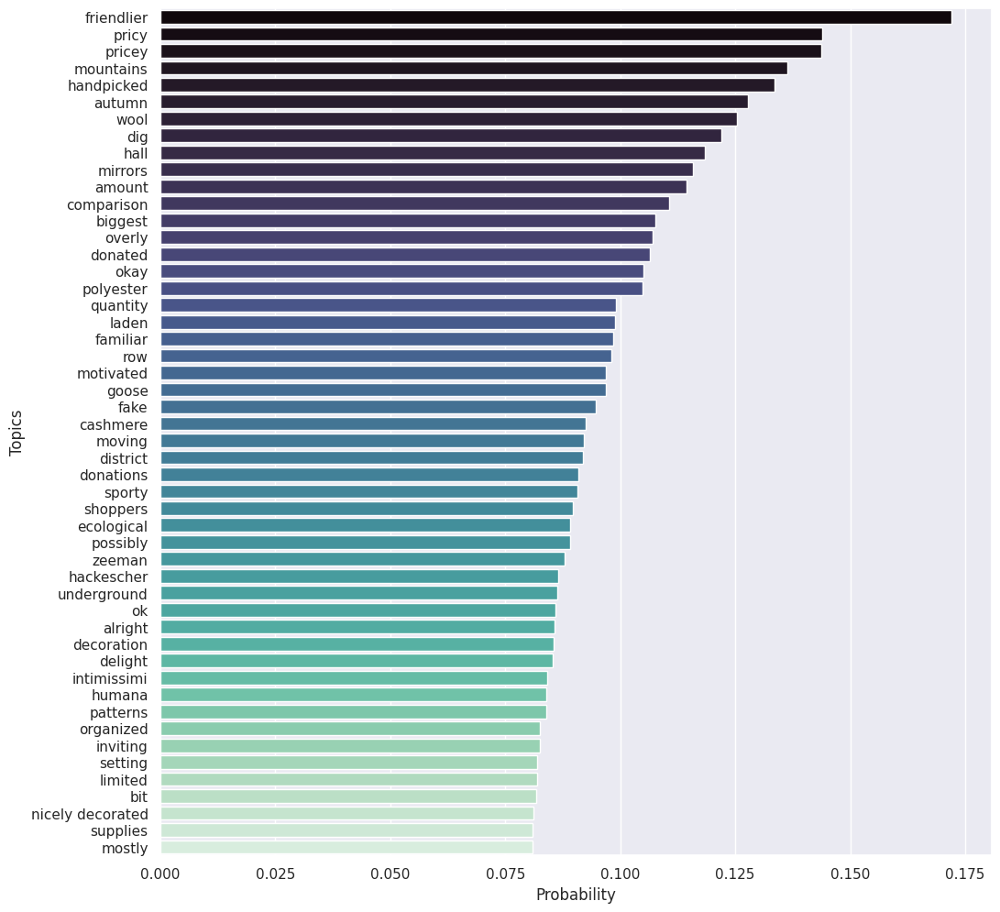

In [50]:
ax = sns.barplot(x="Probability", y="Topics", data=df, palette="mako")

Get semantically similar words (depends on your corpus)

In [63]:
words, word_scores = model.similar_words(keywords=["staff"], keywords_neg=[], num_words=20)
for word, score in zip(words, word_scores):
    print(f"{word} {score}")

friendly 0.8083985310835169
are 0.7779797823628036
very 0.770686326610202
shop 0.7621633870533779
is 0.7564326019270645
there 0.7533189347434284
store 0.753302029862764
nice 0.7449401701005707
helpful 0.7449053410240258
and 0.7448399246658051
good 0.7385359150833046
but 0.7299900910759797
employees 0.7260636203480816
in 0.718266233665463
at 0.717228836857829
well 0.716532496687988
of 0.7162172393640894
always 0.7161005216476886
the 0.715297083266266
clothes 0.7102529252328316


Using a document, search for similar documents

In [57]:
similar_docs = model.search_documents_by_documents([700],5)

In [58]:
for doc in similar_docs[0]:
    print("-----------")
    print(doc)
    print("-----------")
    print()

-----------
() Friendly staff, the range is impressive, for a small budget  (
-----------

-----------
() Very friendly staff, small prices for every budget  (
-----------

-----------
() ... always good for the small budget  (
-----------

-----------
() Large selection for a small budget  (
-----------

-----------
() Large selection for a small budget  (
-----------



## Get all topic data by the documents 

In [ ]:
doc_topics = model.get_documents_topics([i for i in range(len(docs)) ]) # get all topics for all docs

In [ ]:
doc_topics

## Get number of documents which have "wikileaks" as a topic, aggregated to month

In [ ]:
import numpy as np
def find_topic_counts_by_month(term, dates, prob_criteria=0.65, normalize=False):
    found_topic_docs = []

    for doc_idx in range(len(docs)):
        if term in doc_topics[2][doc_idx]:
            arr_index = np.where(doc_topics[2][doc_idx] == term)
            if doc_topics[3][doc_idx][arr_index][0] > prob_criteria:
                found_topic_docs.append(doc_idx)
    
    found_idx_dates = [(idx, dates[idx]) for idx in found_topic_docs]
    df = pd.DataFrame(found_idx_dates)
    df = df.rename(columns={ 0 : "idx", 1: "date"})
    df['Datetime'] = pd.to_datetime(df['date'])
    df = df.set_index('Datetime')
    df[term] = 1
    df = df.drop(columns={ 'idx', 'date'})
    df = df.resample('M').sum()
    
    if normalize == True:
        df_dates = pd.DataFrame(dates)
        df_dates = df_dates.rename(columns={0: 'date'})
        df_dates['Datetime'] = pd.to_datetime(df_dates['date'])
        df_dates = df_dates.set_index('Datetime')
        df_dates = df_dates.drop(columns={ 'date'})
        df_dates['documents'] = 1
        df_dates = df_dates.resample('M').sum()
        df_joined = df.merge(df_dates, left_index=True, right_index=True)
        df_joined[term+'_normalized'] = df_joined[term] / df_joined['documents']
        return df_joined
    
    return df

In [ ]:
df1 = find_topic_counts_by_month("wikileaks", dates)
#df2 = find_topic_counts_by_month("nokia", dates)
#df3 = find_topic_counts_by_month("iphone", dates)
#df4 = find_topic_counts_by_month("android", dates)
# df4 = find_topic_counts_by_month("android", dates)
# df5 = find_topic_counts_by_month("lehman", dates)
# df6 = find_topic_counts_by_month("iran", dates)
df_topic_counts = pd.concat([df1],axis=1) 

In [ ]:
df_topic_counts = df_topic_counts['2010-01-31' :]

In [ ]:
sns.set(rc={'figure.figsize':(20,12)})
sns.lineplot( data=df_topic_counts[['wikileaks']])

# Repeat process with reduced number of topics

In [59]:
modelred = model

In [ ]:
modelred = modelred.hierarchical_topic_reduction(10)

In [64]:
modelred.save("top2vec_user_reviews_deeplearn_10topics")
#modelred = Top2Vec.load("top2vec_user_reviews_deeplearn_10topics")

In [65]:
n = modelred.get_num_topics()

2275

## Get information about the topics

In [14]:
topic_words, word_scores, topic_nums = model.get_topics(n)

In [27]:
topic_words

array([ 823,  869, 1072, 1249,  952,   89,  306,  422,  685, 1997])

In [16]:
topic_sizes, topic_nums = model.get_topic_sizes()

Searching for specific word (e.g., expensive)

In [29]:
import matplotlib.pyplot as plt
%matplotlib inline

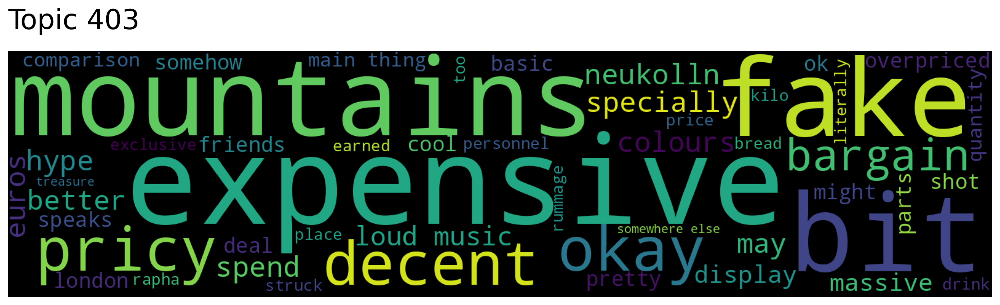

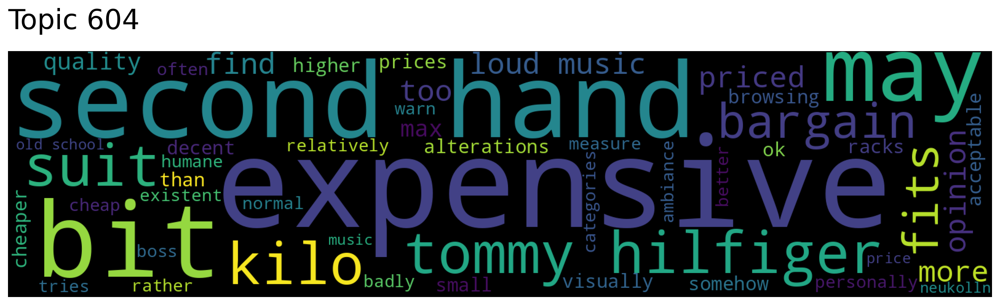

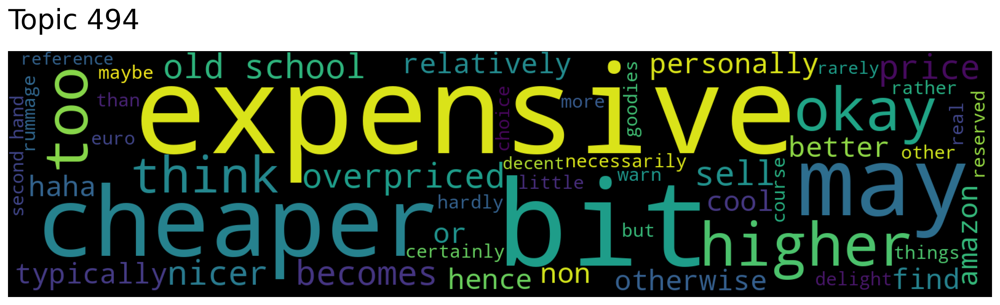

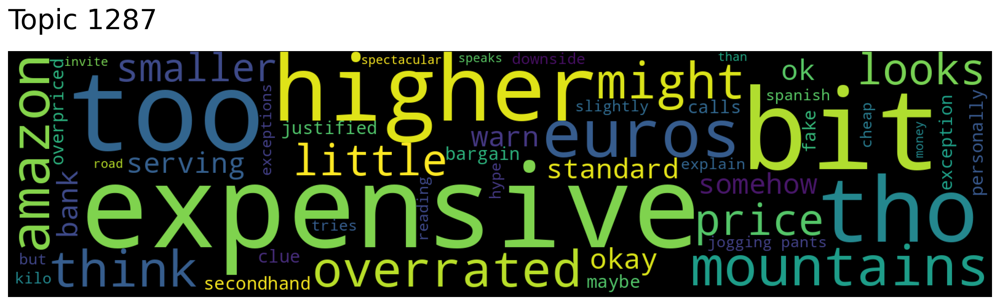

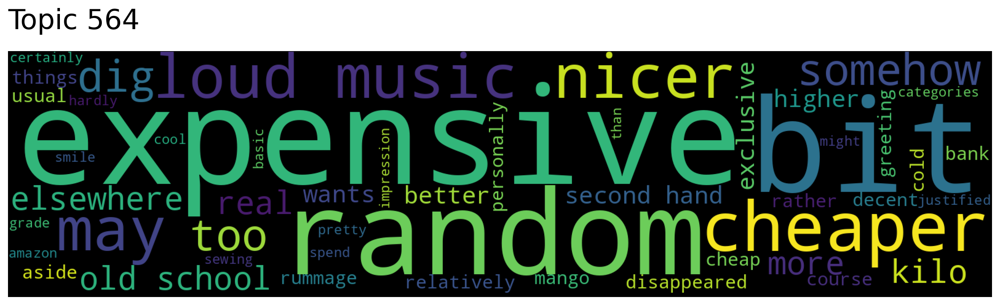

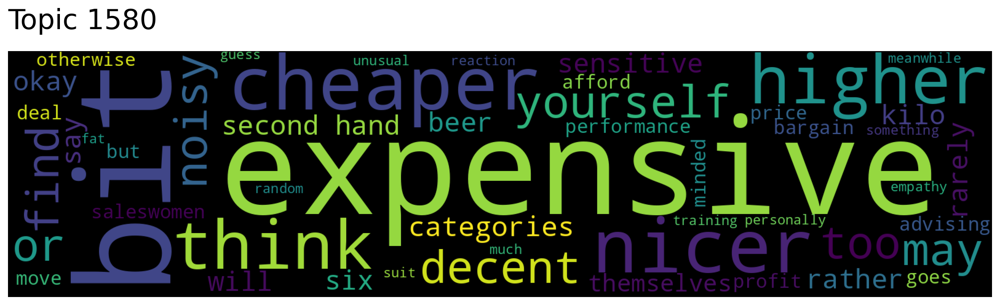

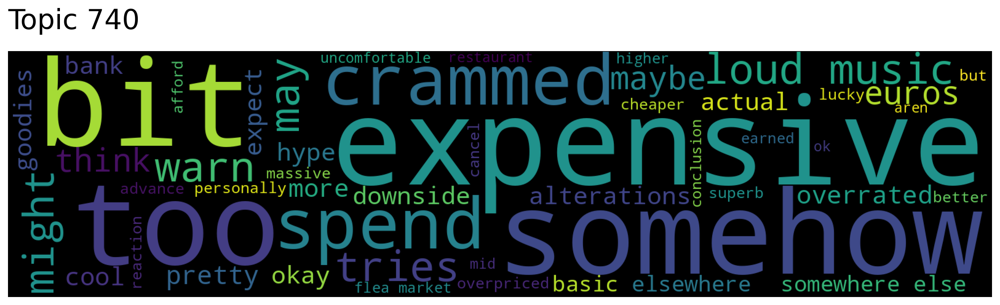

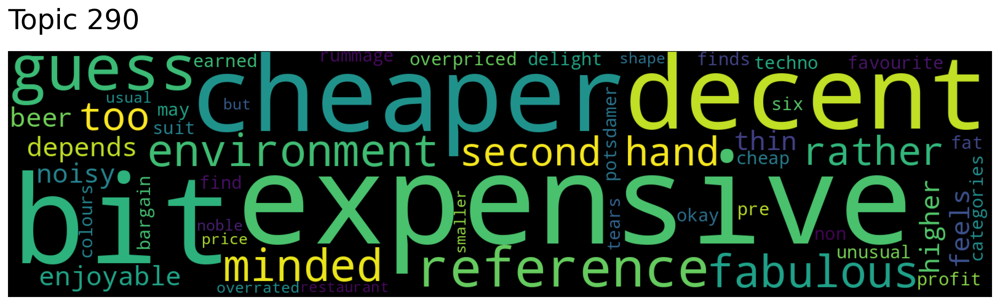

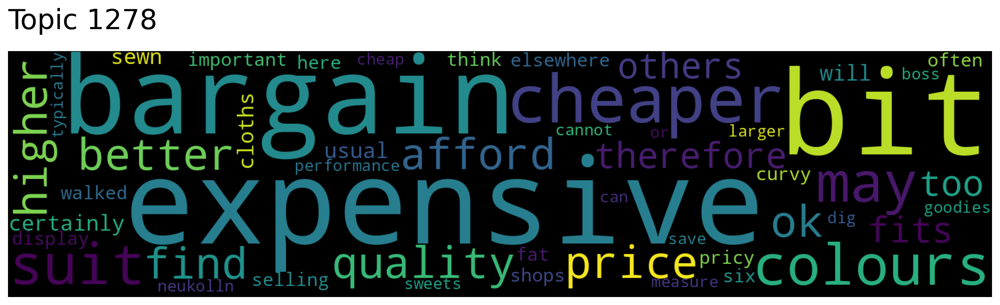

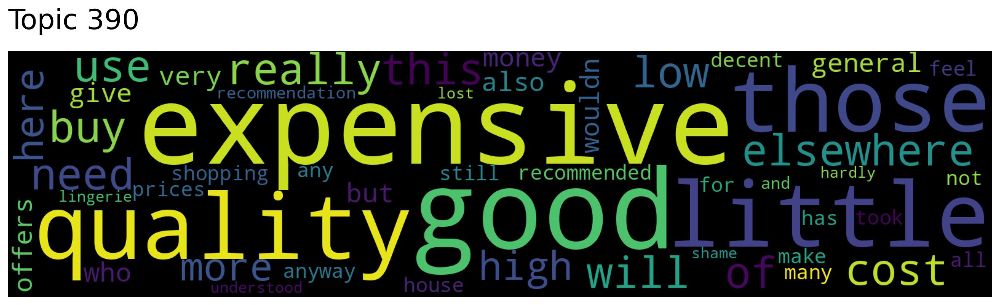

In [31]:
topic_words, word_scores, topic_scores, topic_nums = model.search_topics(keywords=["expensive"], num_topics=10)
for topic in topic_nums:
    model.generate_topic_wordcloud(topic)

**Example of documents with relevant topics: 604, 1287**

In [34]:
documents, document_scores, document_ids = model.search_documents_by_topic(topic_num=1287, num_docs=10)
for doc, score, doc_id in zip(documents, document_scores, document_ids):
    print(f"Document: {doc_id}, Score: {score}")
    print("-----------")
    print(doc)
    print("-----------")
    print()

Document: 130245, Score: 0.9241821765899658
-----------
Very expensive.
-----------

Document: 130250, Score: 0.9219135642051697
-----------
() Expensive  (
-----------

Document: 130508, Score: 0.9176336526870728
-----------
Very expensive.
-----------

Document: 127192, Score: 0.9055293202400208
-----------
() Expensive  (
-----------

Document: 130220, Score: 0.9039701819419861
-----------
() Very expensive....  (
-----------

Document: 130455, Score: 0.9013368487358093
-----------
() Expensive  (
-----------

Document: 129284, Score: 0.8998563885688782
-----------
() Too expensive  (
-----------

Document: 126913, Score: 0.86690354347229
-----------
() Very expensive  (
-----------

Document: 121524, Score: 0.8642505407333374
-----------
() Expensive  (
-----------

Document: 123218, Score: 0.858160674571991
-----------
() too expensive ...  (
-----------



In [42]:
documents, document_scores, document_ids = model.search_documents_by_keywords(keywords=["rude"], num_docs=10)
for doc, score, doc_id in zip(documents, document_scores, document_ids):
    print(f"Document: {doc_id}, Score: {score}")
    print("-----------")
    print(doc)
    print("-----------")
    print()

Document: 157038, Score: 0.3130565285682678
-----------
() Staff is rude.  (
-----------

Document: 91473, Score: 0.30899909138679504
-----------
() Very rude staff !!!!!!  (
-----------

Document: 68442, Score: 0.2965496778488159
-----------
() Staff were very rude!  (
-----------

Document: 68293, Score: 0.2933363914489746
-----------
() Staff were very rude!  (
-----------

Document: 41466, Score: 0.29279208183288574
-----------
The beast stor
-----------

Document: 41574, Score: 0.29073652625083923
-----------
The beast stor
-----------

Document: 158164, Score: 0.2889454960823059
-----------
() The tenants are very nice  (
-----------

Document: 82898, Score: 0.28445547819137573
-----------
() Rude staff.  (
-----------

Document: 96083, Score: 0.2843729555606842
-----------
() Good  (
-----------

Document: 86012, Score: 0.28064268827438354
-----------
Rude staff
-----------



Inspect one of the documents

In [48]:
doc_topics = model.get_documents_topics([100])
doc_topics

(array([479]),
 array([0.78430337], dtype=float32),
 array([['friendlier', 'pricy', 'pricey', 'mountains', 'handpicked',
         'autumn', 'wool', 'dig', 'hall', 'mirrors', 'amount',
         'comparison', 'biggest', 'overly', 'donated', 'okay',
         'polyester', 'quantity', 'laden', 'familiar', 'row', 'motivated',
         'goose', 'fake', 'cashmere', 'moving', 'district', 'donations',
         'sporty', 'shoppers', 'ecological', 'possibly', 'zeeman',
         'hackescher', 'underground', 'ok', 'alright', 'decoration',
         'delight', 'intimissimi', 'humana', 'patterns', 'organized',
         'inviting', 'setting', 'limited', 'bit', 'nicely decorated',
         'supplies', 'mostly']], dtype='<U23'),
 array([[0.17211093, 0.14395222, 0.1437878 , 0.13639134, 0.13357209,
         0.12775168, 0.12535825, 0.12202126, 0.11836207, 0.11581597,
         0.11435152, 0.11061968, 0.10759341, 0.10713544, 0.10644814,
         0.10506455, 0.10490443, 0.0991675 , 0.09884803, 0.09839866,
     

In [49]:
topic_names = doc_topics[2]
topic_probs = doc_topics[3]
df_topics = pd.DataFrame(topic_names).transpose().rename(columns={0 : "Topics"})
df_probs = pd.DataFrame(topic_probs).transpose().rename(columns={0 : "Probability"})
df = pd.concat([df_topics, df_probs], axis=1)

In [46]:
import seaborn as sns
sns.set(rc={'figure.figsize':(11.7,12)})

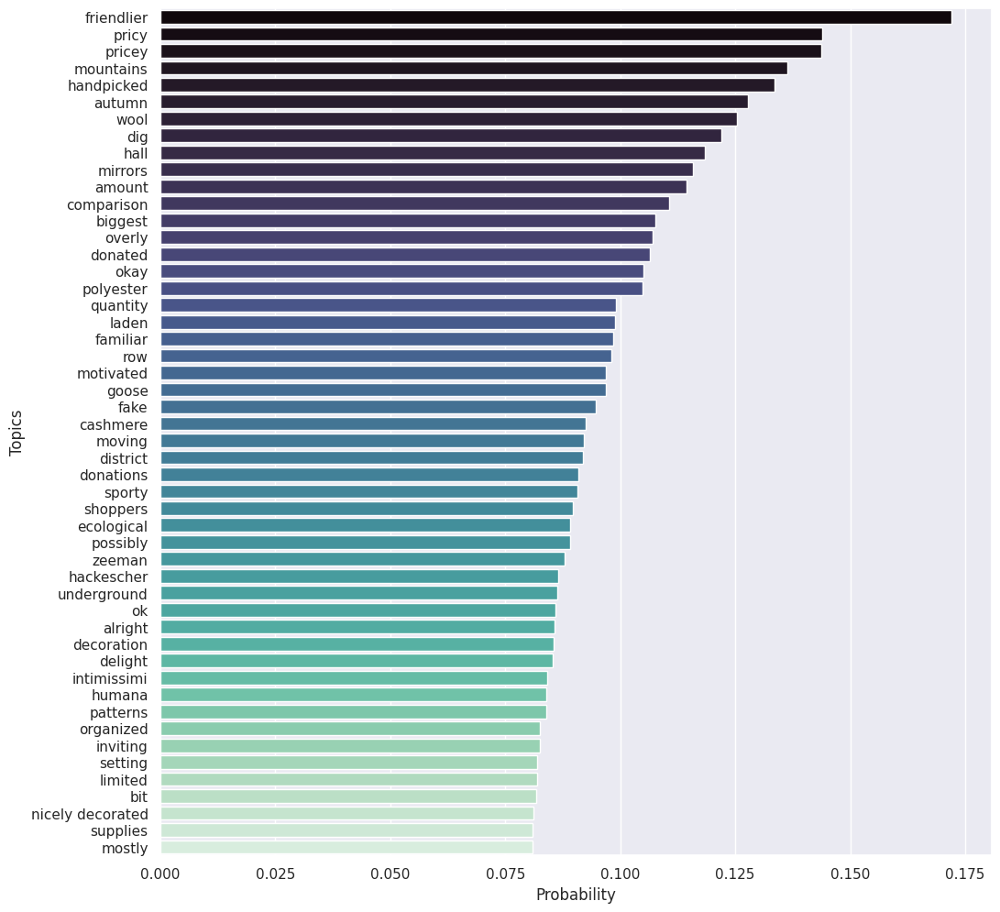

In [50]:
ax = sns.barplot(x="Probability", y="Topics", data=df, palette="mako")

Get semantically similar words (depends on your corpus)

In [63]:
words, word_scores = model.similar_words(keywords=["staff"], keywords_neg=[], num_words=20)
for word, score in zip(words, word_scores):
    print(f"{word} {score}")

friendly 0.8083985310835169
are 0.7779797823628036
very 0.770686326610202
shop 0.7621633870533779
is 0.7564326019270645
there 0.7533189347434284
store 0.753302029862764
nice 0.7449401701005707
helpful 0.7449053410240258
and 0.7448399246658051
good 0.7385359150833046
but 0.7299900910759797
employees 0.7260636203480816
in 0.718266233665463
at 0.717228836857829
well 0.716532496687988
of 0.7162172393640894
always 0.7161005216476886
the 0.715297083266266
clothes 0.7102529252328316


Using a document, search for similar documents

In [57]:
similar_docs = model.search_documents_by_documents([700],5)

In [58]:
for doc in similar_docs[0]:
    print("-----------")
    print(doc)
    print("-----------")
    print()

-----------
() Friendly staff, the range is impressive, for a small budget  (
-----------

-----------
() Very friendly staff, small prices for every budget  (
-----------

-----------
() ... always good for the small budget  (
-----------

-----------
() Large selection for a small budget  (
-----------

-----------
() Large selection for a small budget  (
-----------



## Get all topic data by the documents 

In [ ]:
doc_topics = model.get_documents_topics([i for i in range(len(docs)) ]) # get all topics for all docs

In [ ]:
doc_topics

## Get number of documents which have "wikileaks" as a topic, aggregated to month

In [ ]:
import numpy as np
def find_topic_counts_by_month(term, dates, prob_criteria=0.65, normalize=False):
    found_topic_docs = []

    for doc_idx in range(len(docs)):
        if term in doc_topics[2][doc_idx]:
            arr_index = np.where(doc_topics[2][doc_idx] == term)
            if doc_topics[3][doc_idx][arr_index][0] > prob_criteria:
                found_topic_docs.append(doc_idx)
    
    found_idx_dates = [(idx, dates[idx]) for idx in found_topic_docs]
    df = pd.DataFrame(found_idx_dates)
    df = df.rename(columns={ 0 : "idx", 1: "date"})
    df['Datetime'] = pd.to_datetime(df['date'])
    df = df.set_index('Datetime')
    df[term] = 1
    df = df.drop(columns={ 'idx', 'date'})
    df = df.resample('M').sum()
    
    if normalize == True:
        df_dates = pd.DataFrame(dates)
        df_dates = df_dates.rename(columns={0: 'date'})
        df_dates['Datetime'] = pd.to_datetime(df_dates['date'])
        df_dates = df_dates.set_index('Datetime')
        df_dates = df_dates.drop(columns={ 'date'})
        df_dates['documents'] = 1
        df_dates = df_dates.resample('M').sum()
        df_joined = df.merge(df_dates, left_index=True, right_index=True)
        df_joined[term+'_normalized'] = df_joined[term] / df_joined['documents']
        return df_joined
    
    return df

In [ ]:
df1 = find_topic_counts_by_month("wikileaks", dates)
#df2 = find_topic_counts_by_month("nokia", dates)
#df3 = find_topic_counts_by_month("iphone", dates)
#df4 = find_topic_counts_by_month("android", dates)
# df4 = find_topic_counts_by_month("android", dates)
# df5 = find_topic_counts_by_month("lehman", dates)
# df6 = find_topic_counts_by_month("iran", dates)
df_topic_counts = pd.concat([df1],axis=1) 

In [ ]:
df_topic_counts = df_topic_counts['2010-01-31' :]

In [ ]:
sns.set(rc={'figure.figsize':(20,12)})
sns.lineplot( data=df_topic_counts[['wikileaks']])